In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Carga desde un archivo .csv sin indice
df = pd.read_csv('Mexico_PrivateRoom.csv')
df = df.drop(columns = ["Unnamed: 0"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 50 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            8693 non-null   int64  
 1   last_scraped                                  8693 non-null   object 
 2   name                                          8693 non-null   object 
 3   host_id                                       8693 non-null   int64  
 4   host_name                                     8693 non-null   object 
 5   host_since                                    8693 non-null   object 
 6   host_response_time                            8693 non-null   object 
 7   host_is_superhost                             8693 non-null   object 
 8   host_identity_verified                        8693 non-null   object 
 9   neighbourhood                                 8693 non-null   o

In [3]:
# Convertimos la variable a tipo númerico 

df['instant_bookable'] = (df['instant_bookable'] == 't').astype(int)
df['instant_bookable'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 8693 entries, 0 to 8692
Series name: instant_bookable
Non-Null Count  Dtype
--------------  -----
8693 non-null   int32
dtypes: int32(1)
memory usage: 34.1 KB


<Axes: xlabel='instant_bookable', ylabel='price'>

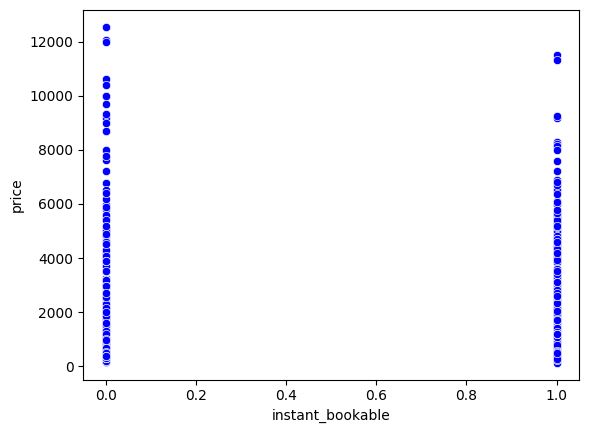

In [4]:
# Imprimimos el scatter plot entre la variable dependiente (price) e independiente (instant_bookable) 
# para observar el comportamiento en su dipersión
from turtle import color

sns.scatterplot(x='instant_bookable', y = 'price', color="blue", data = df)

In [5]:
# Declaramos las variables dependientes e independientes para la regresión lineal
Vars_Indep = df[['instant_bookable']]
Var_Dep = df ['price']

In [6]:
# Se define model como la función de regresión lineal 
from sklearn.linear_model import LinearRegression
model = LinearRegression()

# Verificamos la función relacioanada al modelo 
type(model)

sklearn.linear_model._base.LinearRegression

In [7]:
# Ajustamos el modelo con las variables antes declaradas
model.fit(X = Vars_Indep, y = Var_Dep)

LinearRegression()

In [8]:
# Verificamos los coeficientes obtenidos para el modelo ajustado
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['instant_bookable'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([131.42538684]),
 'rank_': 1,
 'singular_': array([43.86528376]),
 'intercept_': 853.7762643961167}

**Modelo matematico**

In [9]:
# Evaluamos la eficiencia del modelo obtenido por medio del coeficiente R 
model.score(Vars_Indep, Var_Dep)

0.005275744074654032

In [10]:
# Predeciumos los valores del precio del tipo de cuarto a partir de la variable "instant_bookable" 
y_pred = model.predict( X = df [['instant_bookable']])
y_pred

array([853.7762644 , 853.7762644 , 853.7762644 , ..., 985.20165124,
       985.20165124, 985.20165124])

In [11]:
# Insertanos la columnna de predicciones en el dataframe
df.insert(0, 'Predicciones', y_pred)
df

,Predicciones,id,last_scraped,name,host_id,host_name,host_since,host_response_time,host_is_superhost,host_identity_verified,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,853.776264,131610,2024-09-26,MARIA DEL ALMA,647454,Fernando,2011-05-31,Unknown,f,f,...,4.88,4.86,4.92,4.93,4.93,4.81,3.0,1.0,2.0,0.0
1,853.776264,171109,2024-09-25,Cool room near WTC and Metrobus,816295,Carlos,2011-07-13,within a few hours,t,t,...,4.87,4.61,4.98,4.95,4.97,4.81,2.0,0.0,2.0,0.0
2,853.776264,1013504,2024-09-25,"OASIS IN COYOACAN, SHARED HOUSE",1664327,Edoardo,2012-01-28,within an hour,t,t,...,4.90,4.92,4.92,4.94,4.92,4.89,2.0,0.0,2.0,0.0
3,853.776264,1051636,2024-09-26,Chilango chic: room historic Condesa DF,22366411,Citlalli,2014-10-10,Unknown,f,f,...,4.60,4.97,4.97,4.77,4.93,4.73,1.0,0.0,1.0,0.0
4,853.776264,1066945,2024-09-25,"Villa Alfonsina, Heart of Coyoacan",5870021,Héctor,2013-04-10,within an hour,f,t,...,4.94,4.97,4.96,4.91,4.97,4.94,5.0,0.0,5.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,985.201651,1251897198681126075,2024-09-25,Alojamiento sencillo y cómodo,546574784,Sandra,2023-11-15,Unknown,f,t,...,4.88,4.86,4.92,4.93,4.93,4.81,1.0,0.0,1.0,0.0
8689,985.201651,1252141718111439700,2024-09-25,Charming 2-Bedroom Retreat in Lomas de Bezares,67472234,HostPal,2016-04-16,within an hour,t,t,...,4.88,4.86,4.92,4.93,4.93,4.81,37.0,14.0,23.0,0.0
8690,985.201651,1252159821531694005,2024-09-25,Suite King | District Polanco,596009321,Luis Angel,2024-08-13,within an hour,f,t,...,4.88,4.86,4.92,4.93,4.93,4.81,16.0,8.0,8.0,0.0
8691,985.201651,1252185591721328995,2024-09-25,Suite King | District Polanco,596009321,Luis Angel,2024-08-13,within an hour,f,t,...,4.88,4.86,4.92,4.93,4.93,4.81,16.0,8.0,8.0,0.0


<Axes: xlabel='instant_bookable', ylabel='price'>

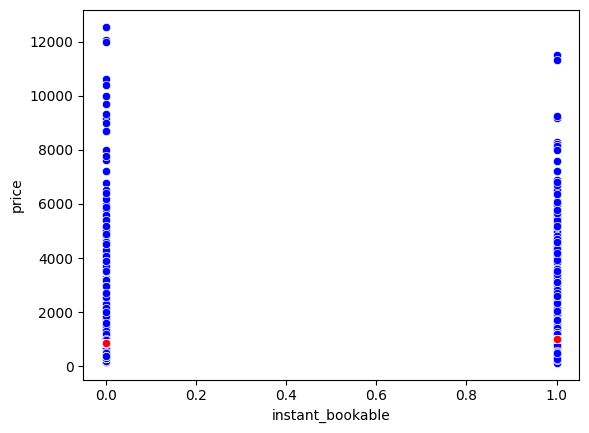

In [12]:
# Visualizamos la gráfica comparartiva entre el precio real y el precio predecido 

sns.scatterplot(x = 'instant_bookable', y = 'price', color = "blue", data = df)
sns.scatterplot(x = 'instant_bookable', y = 'Predicciones', color = "red", data = df)

In [13]:
# Corroboramos cual es el coeficiente de determianción de nuestro modelo
coef_Deter = model.score(X = Vars_Indep, y = Var_Dep)
coef_Deter

0.005275744074654032

In [14]:
# Corroboramos cual es el coeficiente de correlación de nuestro modelo
coef_Correl = np.sqrt(coef_Deter)
coef_Correl

0.07263431747221166

In [16]:
# Filtrar y eliminar columnas de tipo objeto
df = df.select_dtypes(exclude=['object'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 34 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Predicciones                                  8693 non-null   float64
 1   id                                            8693 non-null   int64  
 2   host_id                                       8693 non-null   int64  
 3   latitude                                      8693 non-null   float64
 4   longitude                                     8693 non-null   float64
 5   instant_bookable                              8693 non-null   int32  
 6   host_response_rate                            8693 non-null   float64
 7   host_acceptance_rate                          8693 non-null   float64
 8   host_listings_count                           8693 non-null   float64
 9   host_total_listings_count                     8693 non-null   f

In [16]:
# Graficamos todas las dispersiones entre todas las variables 
sns.pairplot(df)

c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning

In [17]:
# Encontramos todas las correlaciones entre las variables 
Corr_Factors = df.corr()

# Encontramos el valor absoluto de todas las correlaciones entre las variables
Corr_Factors1 = abs(Corr_Factors)

Corr_Factors1

,Predicciones,id,host_id,latitude,longitude,instant_bookable,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
Predicciones,1.000000,0.095177,0.129902,0.127111,0.011345,1.000000,0.118348,0.317000,0.260763,0.253067,...,0.158449,0.105334,0.121751,0.147459,0.092620,0.146572,0.234835,0.164875,0.343754,0.125879
id,0.095177,1.000000,0.414803,0.117557,0.071358,0.095177,0.041894,0.005068,0.125022,0.127322,...,0.019557,0.011761,0.018434,0.022879,0.004365,0.007244,0.093029,0.066024,0.096504,0.011960
host_id,0.129902,0.414803,1.000000,0.079326,0.111274,0.129902,0.015437,0.042965,0.023000,0.009404,...,0.074245,0.024625,0.043254,0.049081,0.078030,0.063690,0.022878,0.010557,0.089468,0.001621
latitude,0.127111,0.117557,0.079326,1.000000,0.085829,0.127111,0.062433,0.045611,0.179964,0.160698,...,0.058494,0.061829,0.013091,0.063018,0.036766,0.049399,0.203074,0.063822,0.097970,0.079469
longitude,0.011345,0.071358,0.111274,0.085829,1.000000,0.011345,0.000408,0.005692,0.021211,0.025635,...,0.051103,0.050144,0.032695,0.033738,0.151433,0.045791,0.000781,0.044752,0.002159,0.023459
instant_bookable,1.000000,0.095177,0.129902,0.127111,0.011345,1.000000,0.118348,0.317000,0.260763,0.253067,...,0.158449,0.105334,0.121751,0.147459,0.092620,0.146572,0.234835,0.164875,0.343754,0.125879
host_response_rate,0.118348,0.041894,0.015437,0.062433,0.000408,0.118348,1.000000,0.228873,0.091034,0.087225,...,0.024695,0.023221,0.027411,0.053024,0.008170,0.023086,0.086742,0.070105,0.120700,0.012977
host_acceptance_rate,0.317000,0.005068,0.042965,0.045611,0.005692,0.317000,0.228873,1.000000,0.024711,0.007275,...,0.015658,0.004000,0.016279,0.026558,0.042921,0.027184,0.080726,0.090808,0.172837,0.018475
host_listings_count,0.260763,0.125022,0.023000,0.179964,0.021211,0.260763,0.091034,0.024711,1.000000,0.963358,...,0.141631,0.109849,0.082423,0.115994,0.026708,0.142713,0.798037,0.449526,0.400086,0.100462
host_total_listings_count,0.253067,0.127322,0.009404,0.160698,0.025635,0.253067,0.087225,0.007275,0.963358,1.000000,...,0.139494,0.105418,0.082618,0.114929,0.020623,0.137209,0.699932,0.427659,0.428691,0.077241


<Axes: >

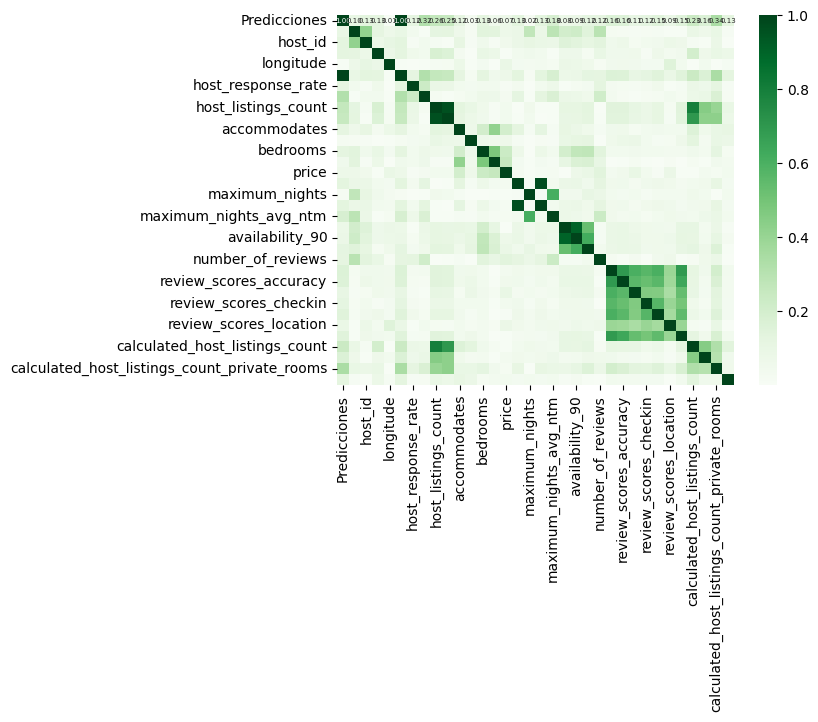

In [18]:
# Ajustamos el mapa de calor de los coeficientes de correlación
Heat_Map = sns.heatmap(Corr_Factors1, cmap = 'Greens', annot = True, fmt = ".2f", annot_kws={"size": 5})

Heat_Map